# Analyse du réseau collaboratif Github :
## Analyse des collaboration dans le projet electron
Le Framework Electron vous permet d'écrire des applications de bureau multiplateformes en utilisant JavaScript, HTML et CSS. Il est basé sur Node.js et Chromium et est utilisé par l'éditeur Atom et de nombreuses autres applications.
[Le répositoire git du projet](https://github.com/electron/electron) a environ 1035 collaborateurs et utilisé par plus de 100k utilisateurs

Les but de ce projets sont : 
  - Extraire l'historique de contribution de ce projet
  - Nettoyage et Filtrage de ces données
  - génération de la matrice adjacentes du graphe du réseau de collaboration


## Extraction de données 
On a extrait les données depuis la commade ```git log [<options>] [<revision range>] [[--] <path>…]``` dans le terminal
Cette commade affiche les journaux de commit, qui peut être stocké par suite dans des fichiers csv ou .log

Commade git pour extraire les fichiers modifié par chaque contributeur dans chaque commit .Ces données sont stockées dans git.log

```git log   --date=local --all --pretty="%x40%h%x2C%an%x2C%ad%x2C" --name-only | tr "\n" " " | tr "@" "\n" >git.log ```

Commade git pour extraire le nombre de lignes ajoutées et supprimées dans chaque commit  .Ces données sont stockées dans stat.csv

```git log  --date=local --all --pretty="%x40%h%x2C%an%x2C%ad%x2C%x22%s%x22%x2C" --shortstat | tr "\n" " " | tr "@" "\n" >> stat.csv```
    
  `sed -i 's/ files changed//g' stat.csv
   sed -i 's/ file changed//g' stat.csv
   sed -i 's/ insertions(+)//g' stat.csv
   sed -i 's/ insertion(+)//g' stat.csv
   sed -i 's/ deletions(-)//g' stat.csv
   sed -i 's/ deletion(-)//g' stat.csv`



ICI ON A Les données d'un mois

In [124]:
#importation des bibliothèques nécessaires
import os
import pandas as pd
from io import *
import numpy as np
from collections import defaultdict
import csv
from datetime import datetime

In [98]:
# importation des noms des fichiers, auteurs et temps du commit depuis le fichier git.log 
git_log = pd.read_csv("git.log", sep=",",header=None,

                      names=[

                           'sha',

                           'author',

                           'timestamp',

                           'filename',

                       ],
                      parse_dates=True,low_memory=False)

In [99]:
# importation des statistiques de modification depuis le fichier stat.csv
git_log2 = pd.read_csv("stat.csv",


                      names=[

                          'sha',

                          'author',

                          'comment',

                          'changed file',

                          'lines added',

                          'lines deleted'

                      ])


In [100]:
#jointure des données : on stocke tous nous donné dans la dataframe data
data = pd.merge(git_log,git_log2,how='left',on=['sha','author'])

### Exploring the data

In [101]:
pd.set_option('display.max_columns', 20)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', None)

In [102]:
data.head()

,sha,author,timestamp,filename,comment,changed file,lines added,lines deleted
0,73cfd82b8,Jeremy Rose,Mon Jun 21 18:41:01 2021,shell/browser/native_window_views.cc shell/browser/native_window_views.h,NaN,NaN,NaN,NaN
1,2c62d3c9c,Jeremy Rose,Mon Jun 21 18:25:32 2021,shell/browser/osr/osr_render_widget_host_view.cc shell/browser/osr/osr_render_widget_host_view.h shell/browser/osr/osr_web_contents_view.cc,NaN,NaN,NaN,NaN
2,c4e3a7eb1,Jeremy Rose,Mon Jun 21 18:25:10 2021,shell/browser/electron_permission_manager.cc,NaN,NaN,NaN,NaN
3,746d71677,Jeremy Rose,Mon Jun 21 18:24:47 2021,patches/chromium/.patches patches/chromium/add_didinstallconditionalfeatures.patch patches/chromium/allow_disabling_blink_scheduler_throttling_per_renderview.patch patches/chromium/allow_in-process_windows_to_have_different_web_prefs.patch patches/chromium/allow_setting_secondary_label_via_simplemenumodel.patch patches/chromium/blink_local_frame.patch patches/chromium/build_do_not_depend_on_packed_resource_integrity.patch patches/chromium/build_read_idl_files_as_utf8_to_fix_python3_character_encodding.patch patches/chromium/can_create_window.patch patches/chromium/chore_provide_iswebcontentscreationoverridden_with_full_params.patch patches/chromium/chore_use_electron_resources_not_chrome_for_spellchecker.patch patches/chromium/disable_color_correct_rendering.patch patches/chromium/disable_compositor_recycling.patch patches/chromium/disable_hidden.patch patches/chromium/don_t_use_potentially_null_getwebframe_-_view_when_get_blink.patch patches/chromium/extend_apply_webpreferences.patch patches/chromium/feat_add_set_theme_source_to_allow_apps_to.patch patches/chromium/feat_add_streaming-protocol_registry_to_multibuffer_data_source.patch patches/chromium/feat_enable_offscreen_rendering_with_viz_compositor.patch patches/chromium/fix_expose_decrementcapturercount_in_web_contents_impl.patch patches/chromium/frame_host_manager.patch patches/chromium/hack_to_allow_gclient_sync_with_host_os_mac_on_linux_in_ci.patch patches/chromium/mas-cgdisplayusesforcetogray.patch patches/chromium/mas_disable_remote_accessibility.patch patches/chromium/mas_no_private_api.patch patches/chromium/notification_provenance.patch patches/chromium/picture-in-picture.patch patches/chromium/printing.patch patches/chromium/refactor_expose_cursor_changes_to_the_webcontentsobserver.patch patches/chromium/render_widget_host_view_base.patch patches/chromium/revert_remove_contentrendererclient_shouldfork.patch patches/chromium/support_mixed_sandbox_with_zygote.patch patches/chromium/sysroot.patch patches/chromium/web_contents.patch patches/chromium/worker_context_will_destroy.patch patches/chromium/worker_feat_add_hook_to_notify_script_ready.patch,NaN,NaN,NaN,NaN
4,afe48522b,Jeremy Rose,Mon Jun 21 18:24:37 2021,DEPS,NaN,NaN,NaN,NaN


In [103]:
data.tail()

,sha,author,timestamp,filename,comment,changed file,lines added,lines deleted
31737,fe35a92de,Adam Roben,Thu Mar 14 17:05:01 2013,brightray/brightray.gyp brightray/common/application_name_mac.mm brightray/common/mac/main_application_bundle.h brightray/common/mac/main_application_bundle.mm brightray/common/main_delegate_mac.mm,NaN,NaN,NaN,NaN
31738,b2a79856e,Adam Roben,Thu Mar 14 13:03:50 2013,brightray/brightray.gyp brightray/browser/browser_main_parts.cc brightray/browser/browser_main_parts.h brightray/browser/devtools_delegate.cc brightray/browser/devtools_delegate.h brightray/browser/devtools_frontend.cc brightray/browser/devtools_frontend.h brightray/browser/inspectable_web_contents.cc brightray/browser/inspectable_web_contents.h brightray/browser/inspectable_web_contents_impl.cc brightray/browser/inspectable_web_contents_impl.h brightray/browser/inspectable_web_contents_view.h brightray/browser/inspectable_web_contents_view_mac.h brightray/browser/inspectable_web_contents_view_mac.mm brightray/browser/mac/bry_inspectable_web_contents_view.h brightray/browser/mac/bry_inspectable_web_contents_view.mm brightray/browser/mac/bry_inspectable_web_contents_view_private.h brightray/common/content_client.cc brightray/common/content_client.h brightray/common/main_delegate.cc brightray/common/main_delegate.h brightray/common/main_delegate_mac.mm,NaN,NaN,NaN,NaN
31739,e1b5e5e1b,Adam Roben,Wed Mar 13 20:45:00 2013,brightray/brightray.gyp brightray/browser/browser_context.cc brightray/common/application_name.h brightray/common/application_name_mac.mm brightray/common/main_delegate_mac.mm,NaN,NaN,NaN,NaN
31740,65dd011fa,Adam Roben,Wed Mar 13 19:42:16 2013,brightray/browser/browser_client.h brightray/browser/browser_context.h brightray/browser/browser_main_parts.h brightray/browser/network_delegate.h brightray/browser/url_request_context_getter.h brightray/common/main_delegate.h,NaN,NaN,NaN,NaN
31741,e451d9212,Adam Roben,Wed Mar 13 19:12:05 2013,brightray/.gitignore brightray/.gitmodules brightray/LICENSE brightray/LICENSE-CHROMIUM brightray/README.md brightray/brightray.gyp brightray/brightray.gypi brightray/browser/browser_client.cc brightray/browser/browser_client.h brightray/browser/browser_context.cc brightray/browser/browser_context.h brightray/browser/browser_main_parts.cc brightray/browser/browser_main_parts.h brightray/browser/browser_main_parts_mac.mm brightray/browser/mac/bry_application.h brightray/browser/mac/bry_application.mm brightray/browser/network_delegate.cc brightray/browser/network_delegate.h brightray/browser/url_request_context_getter.cc brightray/browser/url_request_context_getter.h brightray/common/main_delegate.cc brightray/common/main_delegate.h brightray/common/main_delegate_mac.mm brightray/script/bootstrap brightray/script/build brightray/tools/mac/change_mach_o_flags.py brightray/tools/mac/make_more_helpers.sh brightray/vendor/.gitignore brightray/vendor/libchromiumcontent,NaN,NaN,NaN,NaN


## Prétraitement des données (Data cleaning and preprocessin)
On remarque depuis le tableau précedent qu'il ya des données qui manque( des noms des fichiers lors du merge et les statistiques de suppression et d'ajouts)


In [104]:
## Vérification des types de données 
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31742 entries, 0 to 31741
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   sha            31742 non-null  object
 1   author         31742 non-null  object
 2   timestamp      31742 non-null  object
 3   filename       31742 non-null  object
 4   comment        0 non-null      object
 5   changed file   0 non-null      object
 6   lines added    0 non-null      object
 7   lines deleted  0 non-null      object
dtypes: object(8)
memory usage: 2.2+ MB


In [105]:
## Vérification des données manquant
data.isna().sum()

sha                  0
author               0
timestamp            0
filename             0
comment          31742
changed file     31742
lines added      31742
lines deleted    31742
dtype: int64

In [106]:
## On remplace les données mannquant par 0 puisqu'il figure seulement dans les stats
data.fillna(0)

,sha,author,timestamp,filename,comment,changed file,lines added,lines deleted
0,73cfd82b8,Jeremy Rose,Mon Jun 21 18:41:01 2021,shell/browser/native_window_views.cc shell/browser/native_window_views.h,0,0,0,0
1,2c62d3c9c,Jeremy Rose,Mon Jun 21 18:25:32 2021,shell/browser/osr/osr_render_widget_host_view.cc shell/browser/osr/osr_render_widget_host_view.h shell/browser/osr/osr_web_contents_view.cc,0,0,0,0
2,c4e3a7eb1,Jeremy Rose,Mon Jun 21 18:25:10 2021,shell/browser/electron_permission_manager.cc,0,0,0,0
3,746d71677,Jeremy Rose,Mon Jun 21 18:24:47 2021,patches/chromium/.patches patches/chromium/add_didinstallconditionalfeatures.patch patches/chromium/allow_disabling_blink_scheduler_throttling_per_renderview.patch patches/chromium/allow_in-process_windows_to_have_different_web_prefs.patch patches/chromium/allow_setting_secondary_label_via_simplemenumodel.patch patches/chromium/blink_local_frame.patch patches/chromium/build_do_not_depend_on_packed_resource_integrity.patch patches/chromium/build_read_idl_files_as_utf8_to_fix_python3_character_encodding.patch patches/chromium/can_create_window.patch patches/chromium/chore_provide_iswebcontentscreationoverridden_with_full_params.patch patches/chromium/chore_use_electron_resources_not_chrome_for_spellchecker.patch patches/chromium/disable_color_correct_rendering.patch patches/chromium/disable_compositor_recycling.patch patches/chromium/disable_hidden.patch patches/chromium/don_t_use_potentially_null_getwebframe_-_view_when_get_blink.patch patches/chromium/extend_apply_webpreferences.patch patches/chromium/feat_add_set_theme_source_to_allow_apps_to.patch patches/chromium/feat_add_streaming-protocol_registry_to_multibuffer_data_source.patch patches/chromium/feat_enable_offscreen_rendering_with_viz_compositor.patch patches/chromium/fix_expose_decrementcapturercount_in_web_contents_impl.patch patches/chromium/frame_host_manager.patch patches/chromium/hack_to_allow_gclient_sync_with_host_os_mac_on_linux_in_ci.patch patches/chromium/mas-cgdisplayusesforcetogray.patch patches/chromium/mas_disable_remote_accessibility.patch patches/chromium/mas_no_private_api.patch patches/chromium/notification_provenance.patch patches/chromium/picture-in-picture.patch patches/chromium/printing.patch patches/chromium/refactor_expose_cursor_changes_to_the_webcontentsobserver.patch patches/chromium/render_widget_host_view_base.patch patches/chromium/revert_remove_contentrendererclient_shouldfork.patch patches/chromium/support_mixed_sandbox_with_zygote.patch patches/chromium/sysroot.patch patches/chromium/web_contents.patch patches/chromium/worker_context_will_destroy.patch patches/chromium/worker_feat_add_hook_to_notify_script_ready.patch,0,0,0,0
4,afe48522b,Jeremy Rose,Mon Jun 21 18:24:37 2021,DEPS,0,0,0,0
...,...,...,...,...,...,...,...,...
31737,fe35a92de,Adam Roben,Thu Mar 14 17:05:01 2013,brightray/brightray.gyp brightray/common/application_name_mac.mm brightray/common/mac/main_application_bundle.h brightray/common/mac/main_application_bundle.mm brightray/common/main_delegate_mac.mm,0,0,0,0
31738,b2a79856e,Adam Roben,Thu Mar 14 13:03:50 2013,brightray/brightray.gyp brightray/browser/browser_main_parts.cc brightray/browser/browser_main_parts.h brightray/browser/devtools_delegate.cc brightray/browser/devtools_delegate.h brightray/browser/devtools_frontend.cc brightray/browser/devtools_frontend.h brightray/browser/inspectable_web_contents.cc brightray/browser/inspectable_web_contents.h brightray/browser/inspectable_web_contents_impl.cc brightray/browser/inspectable_web_contents_impl.h brightray/browser/inspectable_web_contents_view.h brightray/browser/inspectable_web_contents_view_mac.h brightray/browser/inspectable_web_contents_view_mac.mm brightray/browser/mac/bry_inspectable_web_contents_view.h brightray/browser/mac/bry_inspectable_web_contents_view.mm brightray/browser/mac/bry_inspectable_web_contents_view_private.h brightray/common/content_client.cc brightray/common/content_client.h brightray/common/main_

In [107]:
data

,sha,author,timestamp,filename,comment,changed file,lines added,lines deleted
0,73cfd82b8,Jeremy Rose,Mon Jun 21 18:41:01 2021,shell/browser/native_window_views.cc shell/browser/native_window_views.h,NaN,NaN,NaN,NaN
1,2c62d3c9c,Jeremy Rose,Mon Jun 21 18:25:32 2021,shell/browser/osr/osr_render_widget_host_view.cc shell/browser/osr/osr_render_widget_host_view.h shell/browser/osr/osr_web_contents_view.cc,NaN,NaN,NaN,NaN
2,c4e3a7eb1,Jeremy Rose,Mon Jun 21 18:25:10 2021,shell/browser/electron_permission_manager.cc,NaN,NaN,NaN,NaN
3,746d71677,Jeremy Rose,Mon Jun 21 18:24:47 2021,patches/chromium/.patches patches/chromium/add_didinstallconditionalfeatures.patch patches/chromium/allow_disabling_blink_scheduler_throttling_per_renderview.patch patches/chromium/allow_in-process_windows_to_have_different_web_prefs.patch patches/chromium/allow_setting_secondary_label_via_simplemenumodel.patch patches/chromium/blink_local_frame.patch patches/chromium/build_do_not_depend_on_packed_resource_integrity.patch patches/chromium/build_read_idl_files_as_utf8_to_fix_python3_character_encodding.patch patches/chromium/can_create_window.patch patches/chromium/chore_provide_iswebcontentscreationoverridden_with_full_params.patch patches/chromium/chore_use_electron_resources_not_chrome_for_spellchecker.patch patches/chromium/disable_color_correct_rendering.patch patches/chromium/disable_compositor_recycling.patch patches/chromium/disable_hidden.patch patches/chromium/don_t_use_potentially_null_getwebframe_-_view_when_get_blink.patch patches/chromium/extend_apply_webpreferences.patch patches/chromium/feat_add_set_theme_source_to_allow_apps_to.patch patches/chromium/feat_add_streaming-protocol_registry_to_multibuffer_data_source.patch patches/chromium/feat_enable_offscreen_rendering_with_viz_compositor.patch patches/chromium/fix_expose_decrementcapturercount_in_web_contents_impl.patch patches/chromium/frame_host_manager.patch patches/chromium/hack_to_allow_gclient_sync_with_host_os_mac_on_linux_in_ci.patch patches/chromium/mas-cgdisplayusesforcetogray.patch patches/chromium/mas_disable_remote_accessibility.patch patches/chromium/mas_no_private_api.patch patches/chromium/notification_provenance.patch patches/chromium/picture-in-picture.patch patches/chromium/printing.patch patches/chromium/refactor_expose_cursor_changes_to_the_webcontentsobserver.patch patches/chromium/render_widget_host_view_base.patch patches/chromium/revert_remove_contentrendererclient_shouldfork.patch patches/chromium/support_mixed_sandbox_with_zygote.patch patches/chromium/sysroot.patch patches/chromium/web_contents.patch patches/chromium/worker_context_will_destroy.patch patches/chromium/worker_feat_add_hook_to_notify_script_ready.patch,NaN,NaN,NaN,NaN
4,afe48522b,Jeremy Rose,Mon Jun 21 18:24:37 2021,DEPS,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
31737,fe35a92de,Adam Roben,Thu Mar 14 17:05:01 2013,brightray/brightray.gyp brightray/common/application_name_mac.mm brightray/common/mac/main_application_bundle.h brightray/common/mac/main_application_bundle.mm brightray/common/main_delegate_mac.mm,NaN,NaN,NaN,NaN
31738,b2a79856e,Adam Roben,Thu Mar 14 13:03:50 2013,brightray/brightray.gyp brightray/browser/browser_main_parts.cc brightray/browser/browser_main_parts.h brightray/browser/devtools_delegate.cc brightray/browser/devtools_delegate.h brightray/browser/devtools_frontend.cc brightray/browser/devtools_frontend.h brightray/browser/inspectable_web_contents.cc brightray/browser/inspectable_web_contents.h brightray/browser/inspectable_web_contents_impl.cc brightray/browser/inspectable_web_contents_impl.h brightray/browser/inspectable_web_contents_view.h brightray/browser/inspectable_web_contents_view_mac.h brightray/browser/inspectable_web_contents_view_mac.mm brightray/browser/mac/bry_inspectable_web_contents_view.h brightray/browser/mac/bry_inspectable_web_contents_view.mm brightray/browser/mac/bry_inspectable_web_contents_view_private.h brightray/common/content_client.cc brightra

In [108]:
## On sauvegarde les données dans un fichier csv 
data.to_csv("logfile.csv", index=False, header=True)

## Analyse Préliminaire

In [109]:
%matplotlib inline

import matplotlib
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=False)
 


In [110]:
plt.rcParams["figure.figsize"] = (20,3)

In [111]:
commits_by_author = data.groupby('author')[['sha']].count()
commits_by_author = commits_by_author.rename(columns = {'sha': 'commit_count'})
commits_by_author = commits_by_author.sort_values(by='commit_count', ascending=False)
top_authors = commits_by_author.head(10)
top_authors

,commit_count
author,
Cheng Zhao,8754
Kevin Sawicki,3066
trop[bot],2295
Electron Bot,1960
Samuel Attard,1546
Shelley Vohr,1344
Jeremy Apthorp,903
John Kleinschmidt,843
deepak1556,728


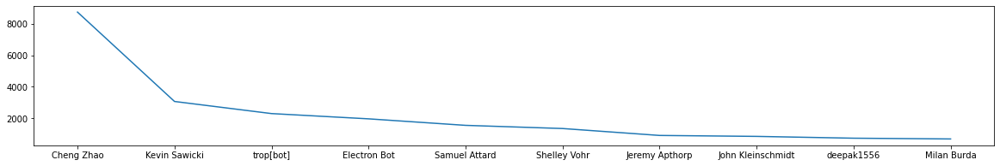

In [112]:

plt.plot(top_authors.index,top_authors.commit_count)


In [113]:
fig = go.Figure([go.Bar(
    x=top_authors.index, 
    y=top_authors.commit_count)])
fig.update_layout(
    title = 'Top Committers', 
    xaxis_title = 'Author', 
    yaxis_title = 'Commits Count', 
    xaxis_tickmode = 'linear',
    xaxis_tickangle=-40)
fig.show()

In [114]:
commits_by_day = data.groupby('timestamp')[['sha']].count()
commits_by_day =commits_by_day.rename(columns = {'sha': 'commit_count'})


In [115]:
fig = go.Figure([go.Scatter(
    x=commits_by_day.index, 
    y=commits_by_day.commit_count, 
    text=commits_by_day.commit_count, 
    fill='tozeroy')])
fig.update_layout(
    title = 'Commits by Date', 
    xaxis_title = 'Date', 
    yaxis_title = 'Commits Count')
fig.show()

In [126]:
 ##On séléctionne les colonnes concerné
filtre1 = ['author', 'filename'] 
data_2 = data[filtre1]
data_2

,author,filename
0,Jeremy Rose,shell/browser/native_window_views.cc shell/browser/native_window_views.h
1,Jeremy Rose,shell/browser/osr/osr_render_widget_host_view.cc shell/browser/osr/osr_render_widget_host_view.h shell/browser/osr/osr_web_contents_view.cc
2,Jeremy Rose,shell/browser/electron_permission_manager.cc
3,Jeremy Rose,patches/chromium/.patches patches/chromium/add_didinstallconditionalfeatures.patch patches/chromium/allow_disabling_blink_scheduler_throttling_per_renderview.patch patches/chromium/allow_in-process_windows_to_have_different_web_prefs.patch patches/chromium/allow_setting_secondary_label_via_simplemenumodel.patch patches/chromium/blink_local_frame.patch patches/chromium/build_do_not_depend_on_packed_resource_integrity.patch patches/chromium/build_read_idl_files_as_utf8_to_fix_python3_character_encodding.patch patches/chromium/can_create_window.patch patches/chromium/chore_provide_iswebcontentscreationoverridden_with_full_params.patch patches/chromium/chore_use_electron_resources_not_chrome_for_spellchecker.patch patches/chromium/disable_color_correct_rendering.patch patches/chromium/disable_compositor_recycling.patch patches/chromium/disable_hidden.patch patches/chromium/don_t_use_potentially_null_getwebframe_-_view_when_get_blink.patch patches/chromium/extend_apply_webpreferences.patch patches/chromium/feat_add_set_theme_source_to_allow_apps_to.patch patches/chromium/feat_add_streaming-protocol_registry_to_multibuffer_data_source.patch patches/chromium/feat_enable_offscreen_rendering_with_viz_compositor.patch patches/chromium/fix_expose_decrementcapturercount_in_web_contents_impl.patch patches/chromium/frame_host_manager.patch patches/chromium/hack_to_allow_gclient_sync_with_host_os_mac_on_linux_in_ci.patch patches/chromium/mas-cgdisplayusesforcetogray.patch patches/chromium/mas_disable_remote_accessibility.patch patches/chromium/mas_no_private_api.patch patches/chromium/notification_provenance.patch patches/chromium/picture-in-picture.patch patches/chromium/printing.patch patches/chromium/refactor_expose_cursor_changes_to_the_webcontentsobserver.patch patches/chromium/render_widget_host_view_base.patch patches/chromium/revert_remove_contentrendererclient_shouldfork.patch patches/chromium/support_mixed_sandbox_with_zygote.patch patches/chromium/sysroot.patch patches/chromium/web_contents.patch patches/chromium/worker_context_will_destroy.patch patches/chromium/worker_feat_add_hook_to_notify_script_ready.patch
4,Jeremy Rose,DEPS
...,...,...
31737,Adam Roben,brightray/brightray.gyp brightray/common/application_name_mac.mm brightray/common/mac/main_application_bundle.h brightray/common/mac/main_application_bundle.mm brightray/common/main_delegate_mac.mm
31738,Adam Roben,brightray/brightray.gyp brightray/browser/browser_main_parts.cc brightray/browser/browser_main_parts.h brightray/browser/devtools_delegate.cc brightray/browser/devtools_delegate.h brightray/browser/devtools_frontend.cc brightray/browser/devtools_frontend.h brightray/browser/inspectable_web_contents.cc brightray/browser/inspectable_web_contents.h brightray/browser/inspectable_web_contents_impl.cc brightray/browser/inspectable_web_contents_impl.h brightray/browser/inspectable_web_contents_view.h brightray/browser/inspectable_web_contents_view_mac.h brightray/browser/inspectable_web_contents_view_mac.mm brightray/browser/mac/bry_inspectable_web_contents_view.h brightray/browser/mac/bry_inspectable_web_contents_view.mm brightray/browser/mac/bry_inspectable_web_contents_view_private.h brightray/common/content_client.cc brightray/common/content_client.h brightray/common/main_delegate.cc brightray/common/main_delegate.h brightray/common/main_delegate_mac.mm
31739,Adam Roben,brightray/brightray.gyp brightray/browser/browser_context.cc brightray/common/application_name.h brightray/common/application_name_mac.mm brightray/common/main_delegate_mac.mm
31740,Adam Roben,brightray/browser/browser_client.h brightray/browser/browser_context.h brightray/brow

In [39]:
## Conversion de la data frame en liste list_1[0] contient les auteurs list[1] contient les fichiers modifiées
list_1 = data_2.values.T.tolist()
## Filtrage des auteurs en liste de la forme [[author1],[author2]....]
casted_to_str=[]
authors=[]
for i in list_1[0]:#conversion en str 
    casted_to_str.append(str(i))
for i in casted_to_str :
    if (i != 'nan'):
        authors.append(i)
authors_filtered=[]
for a in authors:
    temp = []
    temp.append(a)
    authors_filtered.append(temp)
authors_filtered[:10]

[['Jeremy Rose'],
 ['Jeremy Rose'],
 ['Jeremy Rose'],
 ['Jeremy Rose'],
 ['Jeremy Rose'],
 ['Electron Bot'],
 ['Electron Bot'],
 ['Electron Bot'],
 ['Jeremy Rose'],
 ['PatchUp']]

In [40]:
## Filtrage des fichiers en liste de la forme [[fichier1,fichier2...],[fichier1,fichier2...]....]

files = []
casted_to_str = []
for i in list_1[1]: #conversion en str 
    casted_to_str.append(str(i))

for i in casted_to_str:
    if (i != ''):
        files.append(i)

for i in range(len(files)):
    files[i]=files[i].split(" ")   

files_filtered=[]
# supression des strings vides
for i in range(len(files)):
    temp=[]
    for j in files[i]:
          if (j != ''):
                temp.append(j)
    files_filtered.append(temp)
    
files_filtered[:10] 

[['shell/browser/native_window_views.cc',
  'shell/browser/native_window_views.h'],
 ['shell/browser/osr/osr_render_widget_host_view.cc',
  'shell/browser/osr/osr_render_widget_host_view.h',
  'shell/browser/osr/osr_web_contents_view.cc'],
 ['shell/browser/electron_permission_manager.cc'],
 ['patches/chromium/.patches',
  'patches/chromium/add_didinstallconditionalfeatures.patch',
  'patches/chromium/allow_disabling_blink_scheduler_throttling_per_renderview.patch',
  'patches/chromium/allow_in-process_windows_to_have_different_web_prefs.patch',
  'patches/chromium/allow_setting_secondary_label_via_simplemenumodel.patch',
  'patches/chromium/blink_local_frame.patch',
  'patches/chromium/build_do_not_depend_on_packed_resource_integrity.patch',
  'patches/chromium/build_read_idl_files_as_utf8_to_fix_python3_character_encodding.patch',
  'patches/chromium/can_create_window.patch',
  'patches/chromium/chore_provide_iswebcontentscreationoverridden_with_full_params.patch',
  'patches/chromium

In [41]:
## Vérification de correspondance des données
len(files_filtered)==len(authors_filtered) 
  

True

In [42]:
#Construction de la liste souhaité [[author1,File1,File2,...],[author2,File1,File5,...],....]
#par concaténation des deux listes précedente
Res = []

for i in range(len(authors_filtered)):  # or listed_files because they have the same length

    tempo = []

    tempo = authors_filtered[i] + files_filtered[i]

    Res.append(tempo)
Res[:10]

[['Jeremy Rose',
  'shell/browser/native_window_views.cc',
  'shell/browser/native_window_views.h'],
 ['Jeremy Rose',
  'shell/browser/osr/osr_render_widget_host_view.cc',
  'shell/browser/osr/osr_render_widget_host_view.h',
  'shell/browser/osr/osr_web_contents_view.cc'],
 ['Jeremy Rose', 'shell/browser/electron_permission_manager.cc'],
 ['Jeremy Rose',
  'patches/chromium/.patches',
  'patches/chromium/add_didinstallconditionalfeatures.patch',
  'patches/chromium/allow_disabling_blink_scheduler_throttling_per_renderview.patch',
  'patches/chromium/allow_in-process_windows_to_have_different_web_prefs.patch',
  'patches/chromium/allow_setting_secondary_label_via_simplemenumodel.patch',
  'patches/chromium/blink_local_frame.patch',
  'patches/chromium/build_do_not_depend_on_packed_resource_integrity.patch',
  'patches/chromium/build_read_idl_files_as_utf8_to_fix_python3_character_encodding.patch',
  'patches/chromium/can_create_window.patch',
  'patches/chromium/chore_provide_iswebconte

In [43]:
# Création d'un dictionnaire à partir de la liste précedent 
##tel que chaque auteur est regroupé avec tous les fichier qu'il a modifié
regrouped_data = defaultdict(list)
for k, *v in Res:
    regrouped_data[k].append(v)



regrouped_data= list(regrouped_data.items())

regrouped_data_temp=[]

for i in regrouped_data:
    regrouped_data_temp.append(list(i))


for i in regrouped_data_temp:

    for j in range(1, len( i[1])):

        i[1][0] = i[1][0] + i[1][1]

        del i[1][1]



for i in regrouped_data_temp:

    for j in range(len(i[1][0])):

        i.append(i[1][0][j])

    del i[1]



## Notre dernière liste contient est de la forme  [[author1,File1,File2,...],[author2,File1,File5,...],....] sans redoublement des auteurs et des fichiers

regrouped_data_filtered=[]

for i in regrouped_data_temp:

    i= list(dict.fromkeys(i))

    regrouped_data_filtered.append(i)
df=pd.DataFrame(regrouped_data_filtered)
df.head()


,0,1,2,3,4,5,6,7,8,9,...,2634,2635,2636,2637,2638,2639,2640,2641,2642,2643
0,Jeremy Rose,shell/browser/native_window_views.cc,shell/browser/native_window_views.h,shell/browser/osr/osr_render_widget_host_view.cc,shell/browser/osr/osr_render_widget_host_view.h,shell/browser/osr/osr_web_contents_view.cc,shell/browser/electron_permission_manager.cc,patches/chromium/.patches,patches/chromium/add_didinstallconditionalfeatures.patch,patches/chromium/allow_disabling_blink_scheduler_throttling_per_renderview.patch,...,None,None,None,None,None,None,None,None,None,None
1,Electron Bot,ELECTRON_VERSION,package.json,shell/browser/resources/win/electron.rc,DEPS,build/args/all.gn,patches/chromium/.patches,patches/chromium/add_didinstallconditionalfeatures.patch,patches/chromium/add_realloc.patch,patches/chromium/add_setter_for_browsermainloop_result_code.patch,...,None,None,None,None,None,None,None,None,None,None
2,PatchUp,patches/chromium/cherry-pick-b77b38a3380c.patch,patches/chromium/cherry-pick-910e9e40d376.patch,patches/chromium/cherry-pick-d9556a80a790.patch,patches/v8/cherry-pick-fd8cbdf7b888.patch,patches/v8/cherry-pick-b9ad6a864c79.patch,patches/angle/cherry-pick-3d4f87ab5b9b.patch,patches/v8/cherry-pick-9da8fb7c4b80.patch,patches/v8/cherry-pick-d0aadee1a60a.patch,patches/chromium/blink_local_frame.patch,...,None,None,None,None,None,None,None,None,None,None
3,Pedro Pontes,patches/chromium/.patches,patches/chromium/cherry-pick-b77b38a3380c.patch,patches/chromium/cherry-pick-910e9e40d376.patch,patches/chromium/cherry-pick-d9556a80a790.patch,patches/v8/.patches,patches/v8/cherry-pick-fd8cbdf7b888.patch,patches/v8/cherry-pick-b9ad6a864c79.patch,patches/chromium/cherry-pick-34d5af37f9ac.patch,patches/chromium/cherry-pick-0e36d324d6ef.patch,...,None,None,None,None,None,None,None,None,None,None
4,Shelley Vohr,shell/browser/native_window_mac.mm,patches/chromium/extend_apply_webpreferences.patch,patches/node/.patches,patches/node/src_remove_extra_semis_from_member_fns.patch,chromium_src/BUILD.gn,shell/browser/api/electron_api_web_contents.cc,shell/browser/api/electron_api_web_contents.h,shell/browser/ui/inspectable_web_contents.cc,shell/browser/ui/inspectable_web_contents_delegate.h,...,None,None,None,None,None,None,None,None,None,None


In [44]:
authors = []
for e in regrouped_data_filtered:
    authors.append(e[0])
authors
    

['Jeremy Rose',
 'Electron Bot',
 'PatchUp',
 'Pedro Pontes',
 'Shelley Vohr',
 'trop[bot]',
 'marekharanczyk',
 'Fedor Indutny',
 'Darshan Sen',
 'Samuel Attard',
 'David Sanders',
 'Erick Zhao',
 'Samuel Maddock',
 'sssooonnnggg',
 'mlaurencin',
 'dependabot[bot]',
 'John Kleinschmidt',
 'George Xu',
 'electron-roller[bot]',
 'Keeley Hammond',
 'Milan Burda',
 'VerteDinde',
 'Charles Kerr',
 'Cheng Zhao',
 'kdau',
 'Calvin',
 'Kevin Hartman',
 'Luke Ingalls',
 'Marek Haranczyk',
 'ZReC',
 'Jeremy Foster',
 'Juan Cruz Viotti',
 'Sergio Padrino',
 'Pete Torres',
 'Vishal',
 'aydon',
 'Raymond Zhao',
 'Sofia Nguy',
 'Michaela Laurencin',
 'Ethan Arrowood',
 'Tony Ferrell',
 'Robo',
 'Andrey Belenko',
 'deepak1556',
 'Tabea4',
 'Thomas Kainrad',
 'Noelle Leigh',
 'clavin',
 'Ondreas',
 'PalmerAL',
 'Tabish Mahfuz',
 'Shatyuka',
 'Matthijs Groen',
 'Hamish Macpherson',
 'Rajdeep Chatterjee',
 'Naoki Maeda',
 'Michael Kozakov',
 'samuelmaddock',
 'Mark Lee',
 'robin',
 'KSneijders',
 'sent

### Matrice adjacents

In [45]:
#on crée une matrice remplie de 0
matrice = np.zeros((len(regrouped_data_filtered), len(regrouped_data_filtered))) 



def intersection(lst1,lst2):  #cette fonction 

    R = list(set(lst1) & set(lst2))

    I = len(R)

    return I


for i in range(len(regrouped_data_filtered)):  

    for j in range(len(regrouped_data_filtered)):

        H = intersection(regrouped_data_filtered[i], regrouped_data_filtered[j])

        if (i != j):  

            matrice[i][j] = H


matrice = pd.DataFrame(data=matrice, columns=authors,index=authors)  
matrice.to_csv(r'C:\Users\PRO\Documents\GitHub\SNA\MATRICE_ADJACENTE.mat', index=True,header=True)  

In [46]:
matrice

,Jeremy Rose,Electron Bot,PatchUp,Pedro Pontes,Shelley Vohr,trop[bot],marekharanczyk,Fedor Indutny,Darshan Sen,Samuel Attard,...,CoolOppo,Dan Schuman,Dorian Marié,Hugh Kennedy,probablycorey,Corey Johnson,Patrick Reynolds,Kyle Robinson Young,Matt Colyer,Steve Smith
Jeremy Rose,0.0,317.0,20.0,11.0,292.0,373.0,2.0,5.0,1.0,391.0,...,1.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0
Electron Bot,317.0,0.0,32.0,29.0,496.0,584.0,2.0,6.0,1.0,838.0,...,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0
PatchUp,20.0,32.0,0.0,8.0,34.0,30.0,0.0,0.0,0.0,29.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Pedro Pontes,11.0,29.0,8.0,0.0,25.0,24.0,1.0,1.0,0.0,30.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
Shelley Vohr,292.0,496.0,34.0,25.0,0.0,773.0,1.0,7.0,1.0,982.0,...,1.0,0.0,0.0,1.0,3.0,0.0,3.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Corey Johnson,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Patrick Reynolds,0.0,0.0,0.0,0.0,3.0,3.0,0.0,0.0,0.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Kyle Robinson Young,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Matt Colyer,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [47]:
import pandas as pd  
df = pd.read_csv("MATRICE_ADJACENTE.mat")

In [48]:
print(df)

               Unnamed: 0  Jeremy Rose  Electron Bot  PatchUp  Pedro Pontes  Shelley Vohr  trop[bot]  marekharanczyk  Fedor Indutny  Darshan Sen  ...  CoolOppo  Dan Schuman  Dorian Marié  Hugh Kennedy  probablycorey  Corey Johnson  Patrick Reynolds  Kyle Robinson Young  Matt Colyer  Steve Smith
0             Jeremy Rose          0.0         317.0     20.0          11.0         292.0      373.0             2.0            5.0          1.0  ...       1.0          0.0           0.0           0.0            3.0            0.0               0.0                  0.0          0.0          0.0
1            Electron Bot        317.0           0.0     32.0          29.0         496.0      584.0             2.0            6.0          1.0  ...       0.0          0.0           0.0           1.0            2.0            0.0               0.0                  0.0          0.0          0.0
2                 PatchUp         20.0          32.0      0.0           8.0          34.0       30.0            

# Analyse des réseaux sociaux

In [50]:
import sys
sys.path

['C:\\Users\\PRO\\Documents\\GitHub\\SNA',
 'C:\\Users\\PRO\\anaconda3\\python39.zip',
 'C:\\Users\\PRO\\anaconda3\\DLLs',
 'C:\\Users\\PRO\\anaconda3\\lib',
 'C:\\Users\\PRO\\anaconda3',
 '',
 'C:\\Users\\PRO\\AppData\\Roaming\\Python\\Python39\\site-packages',
 'C:\\Users\\PRO\\AppData\\Roaming\\Python\\Python39\\site-packages\\win32',
 'C:\\Users\\PRO\\AppData\\Roaming\\Python\\Python39\\site-packages\\win32\\lib',
 'C:\\Users\\PRO\\AppData\\Roaming\\Python\\Python39\\site-packages\\Pythonwin',
 'C:\\Users\\PRO\\anaconda3\\lib\\site-packages',
 'C:\\Users\\PRO\\anaconda3\\lib\\site-packages\\locket-0.2.1-py3.9.egg',
 'C:\\Users\\PRO\\anaconda3\\lib\\site-packages\\win32',
 'C:\\Users\\PRO\\anaconda3\\lib\\site-packages\\win32\\lib',
 'C:\\Users\\PRO\\anaconda3\\lib\\site-packages\\Pythonwin',
 'C:\\Users\\PRO\\anaconda3\\lib\\site-packages\\IPython\\extensions',
 'C:\\Users\\PRO\\.ipython']

In [51]:
! conda list 

# packages in environment at C:\Users\PRO\anaconda3:
#
# Name                    Version                   Build  Channel
_ipyw_jlab_nb_ext_conf    0.1.0            py39haa95532_0  
alabaster                 0.7.12             pyhd3eb1b0_0  
anaconda                  2021.11                  py39_0  
anaconda-client           1.9.0            py39haa95532_0  
anaconda-navigator        2.1.1                    py39_0  
anaconda-project          0.10.1             pyhd3eb1b0_0  
anyio                     2.2.0            py39haa95532_2  
appdirs                   1.4.4              pyhd3eb1b0_0  
argh                      0.26.2           py39haa95532_0  
argon2-cffi               20.1.0           py39h2bbff1b_1  
arrow                     0.13.1           py39haa95532_0  
asn1crypto                1.4.0                      py_0  
astroid                   2.6.6            py39haa95532_0  
astropy                   4.3.1            py39hc7d831d_0  
async_generator           1.10        

In [52]:
import json
import networkx as nx
import matplotlib.pyplot as plt
import networkx as nx
import matplotlib.pyplot as plt
import nxviz as nv


In [53]:
graph=nx.from_pandas_adjacency(matrice)


In [54]:
print(nx.info(graph))
nodes=graph.number_of_nodes()

Graph with 1228 nodes and 43021 edges


# Nœuds importants

## Centralité des degrés

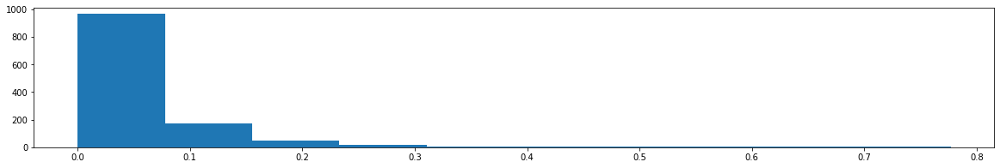

In [55]:
# Tracez la distribution des degrés du réseau de collaboration GitHub
plt.hist(list(nx.degree_centrality(graph).values()))
plt.show()

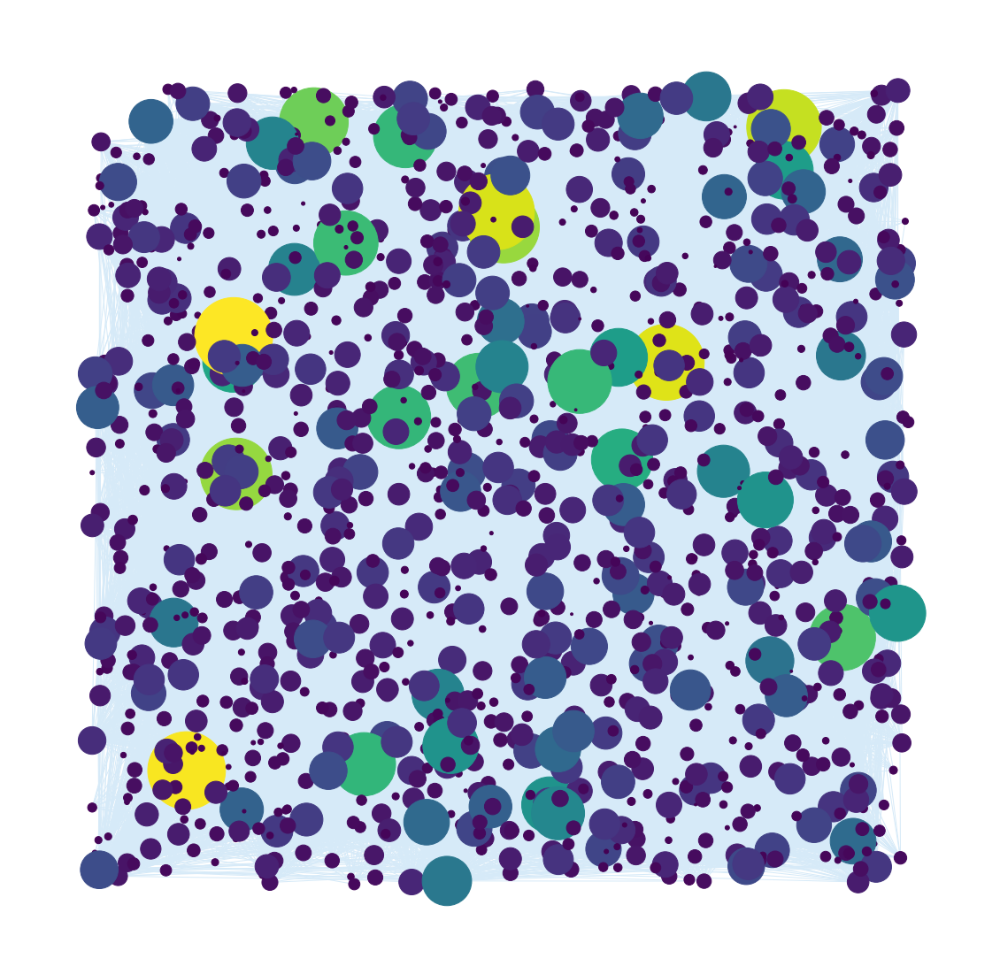

In [56]:
pos = nx.random_layout(graph)
degCent = nx.degree_centrality(graph)
node_color = [20000.0 * graph.degree(v) for v in graph]
node_size =  [v * 10000 for v in degCent.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(graph, pos=pos, with_labels=False,
                 node_color=node_color,
                 node_size=node_size,edge_color='#D6EAF8')
plt.axis('off')
f=sorted(degCent, key=degCent.get, reverse=True)[:5]

### Sous-graphe des contributeurs avec le degré de centralité le plus élevé

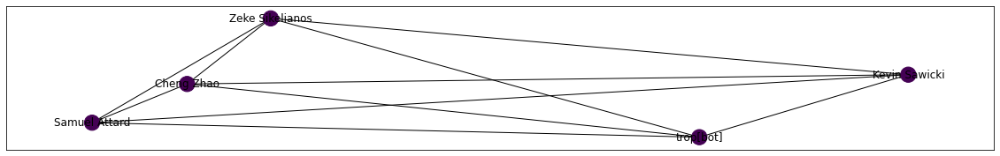

In [57]:
subgraph1 = graph.subgraph(sorted(degCent, key=degCent.get, reverse=True)[:5])
node_color = [20000.0 * subgraph1.degree(v) for v in subgraph1]
nx.draw_networkx(subgraph1, with_labels=True,
                 node_color=node_color,
               )

In [58]:
avg_degree= sum(degCent.values())/nodes
print(avg_degree)

0.05710413630342266


## Betweness Centrality

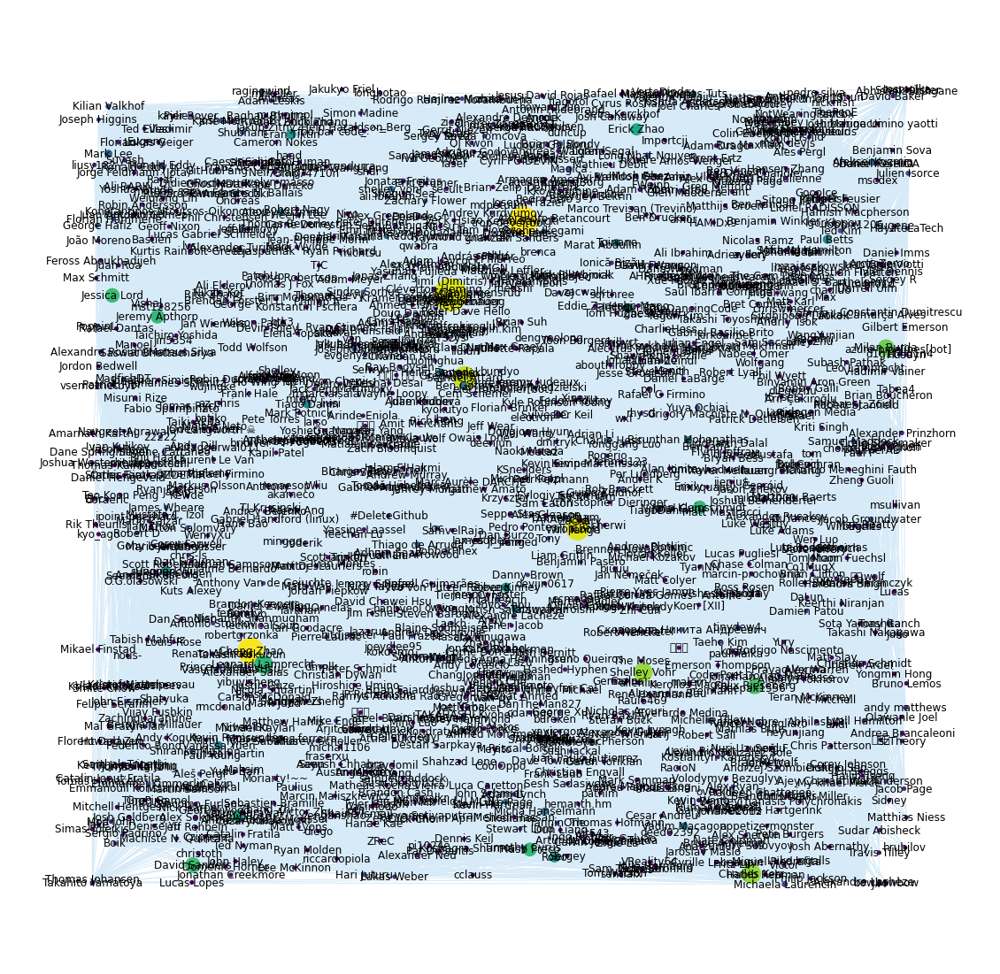

In [60]:
pos = nx.random_layout(graph)
betCent = nx.betweenness_centrality(graph, normalized=True, endpoints=True)
node_color = [20000.0 * graph.degree(v) for v in graph]
node_size =  [v * 10000 for v in betCent.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(graph, pos=pos, with_labels=True,
                 node_color=node_color,
                 node_size=node_size,edge_color='#D6EAF8' )
plt.axis('off')
f=sorted(betCent, key=betCent.get, reverse=True)[:5]

### Subgraph of contributers with highest betweeness centrality

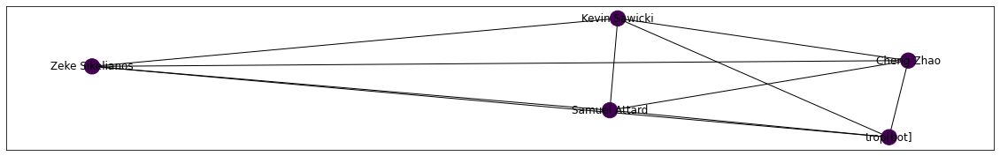

In [61]:
subgraph2 = graph.subgraph(sorted(betCent, key=betCent.get, reverse=True)[:5])
node_color = [125.0 * subgraph2.degree(v) for v in subgraph2]
nx.draw_networkx(subgraph2, with_labels=True,
                 node_color=node_color
               )

In [62]:
avg_betweeness= sum(betCent.values())/nodes
print(avg_betweeness)

0.0023730349774971926


## Closeness Centrality

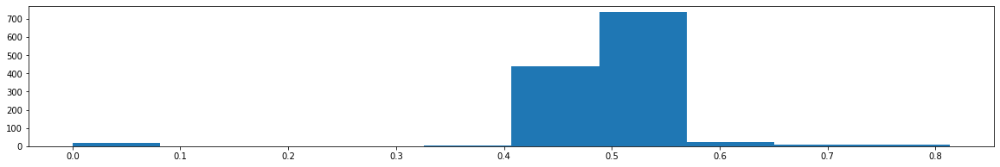

In [63]:
plt.hist(list(nx.closeness_centrality(graph).values()))
plt.show()

['Kevin Sawicki',
 'Cheng Zhao',
 'trop[bot]',
 'Zeke Sikelianos',
 'Samuel Attard']

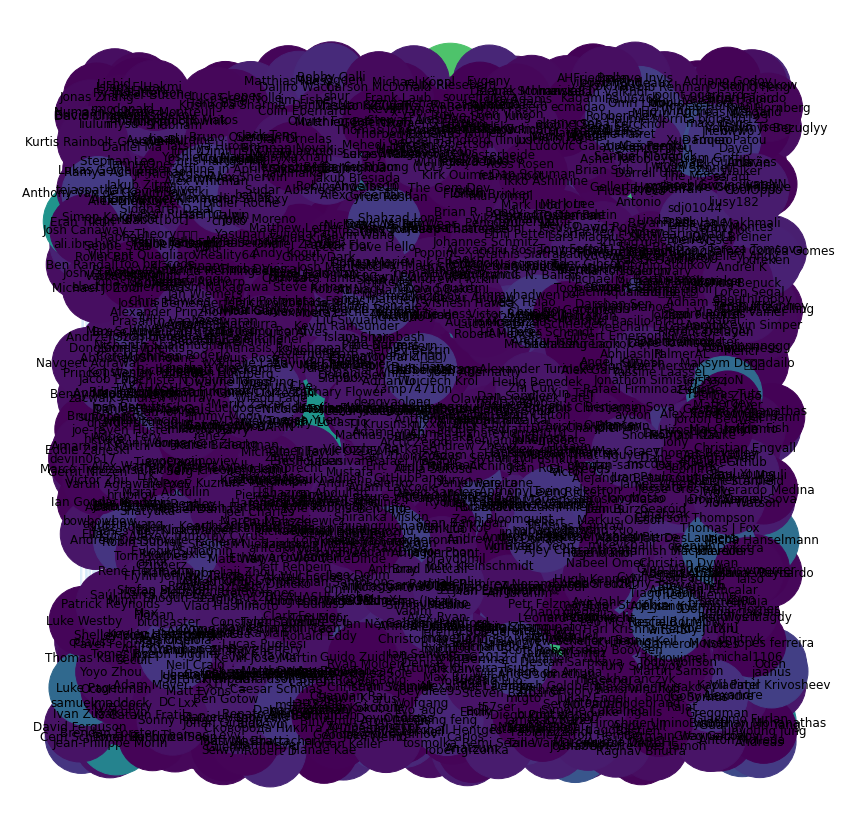

In [66]:
pos = nx.random_layout(graph)
cloCent = nx.closeness_centrality(graph)
node_color = [20000.0 * graph.degree(v) for v in graph]
node_size =  [v * 10000 for v in cloCent.values()]
plt.figure(figsize=(15,15))
nx.draw_networkx(graph, pos=pos, with_labels=True,
                 node_color=node_color,
                 node_size=node_size,edge_color='#D6EAF8' )
plt.axis('off')
sorted(cloCent, key=cloCent.get, reverse=True)[:5]

In [67]:
avg_closeness = sum(cloCent.values())/nodes
print(avg_closeness)

0.4917801390657986


### Subgraph of contributers with highest closeness centrality

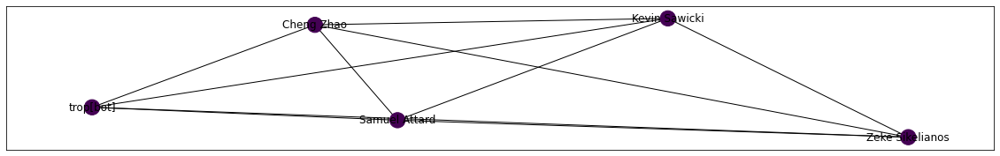

In [68]:
subgraph2 = graph.subgraph(sorted(cloCent, key=cloCent.get, reverse=True)[:5])
node_color = [125.0 * subgraph2.degree(v) for v in subgraph2]
nx.draw_networkx(subgraph2, with_labels=True,
                 node_color=node_color
               )

## Eeigenvector Centrality

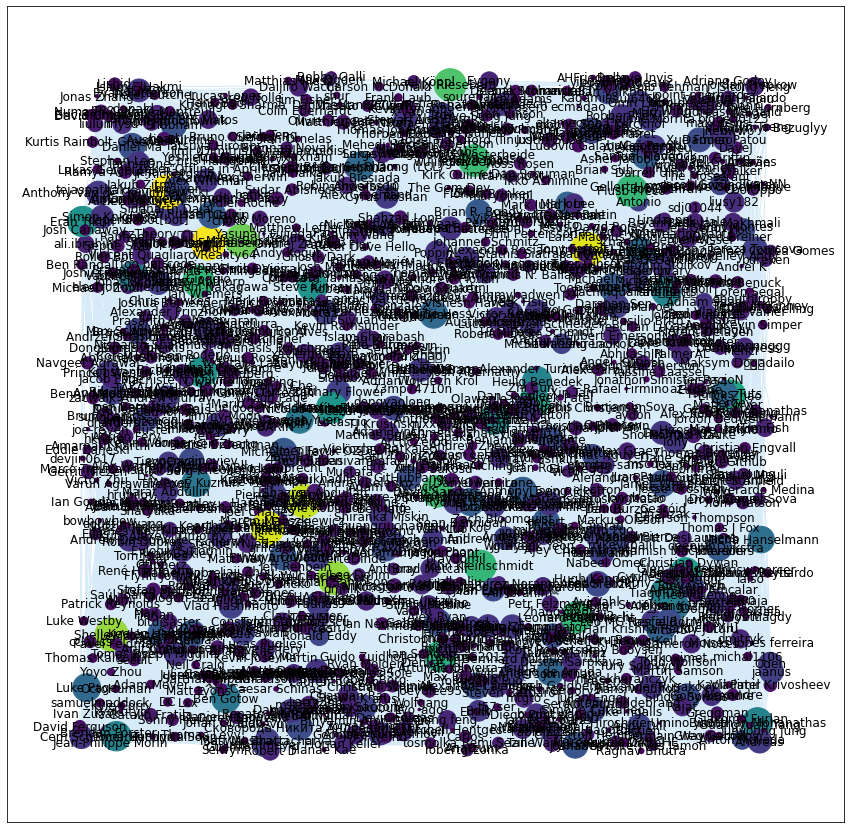

In [69]:
eigCent = nx.eigenvector_centrality(graph)
node_color = [20000.0 * graph.degree(v) for v in graph]
node_size =  [v * 10000 for v in eigCent.values()]
plt.figure(figsize=(15,15))
nx.draw_networkx(graph, pos=pos, with_labels=True,
                 node_color=node_color,
                 node_size=node_size,edge_color='#D6EAF8' )

### Subgraph of contributers with highest eightvector centrality

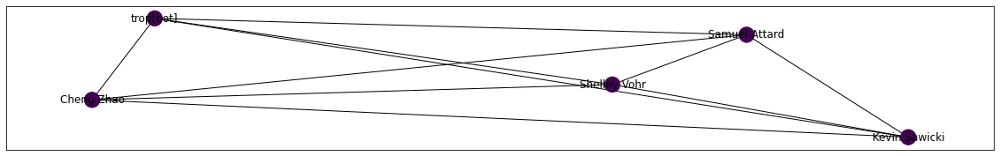

In [70]:
subgraph2 = graph.subgraph(sorted(eigCent, key=eigCent.get, reverse=True)[:5])
node_color = [125.0 * subgraph2.degree(v) for v in subgraph2]
nx.draw_networkx(subgraph2, with_labels=True,
                 node_color=node_color
               )

## Connected Components


Subgraph has 1212 nodes


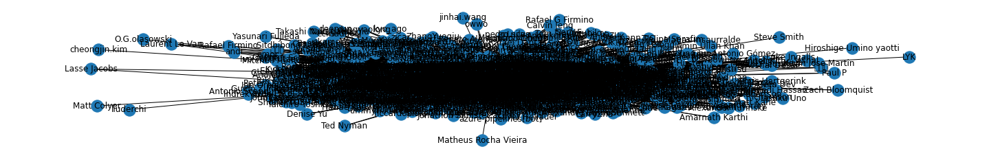

Subgraph has 1 nodes


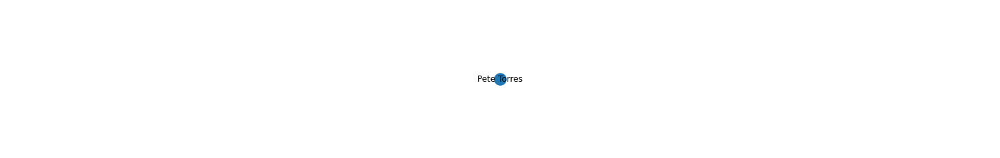

Subgraph has 1 nodes


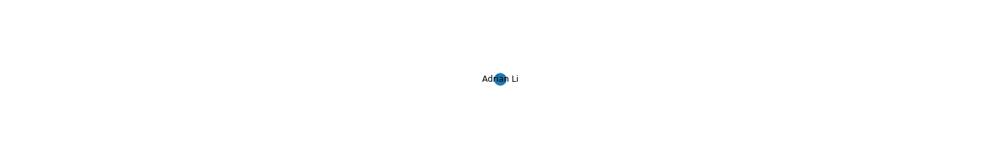

Subgraph has 1 nodes


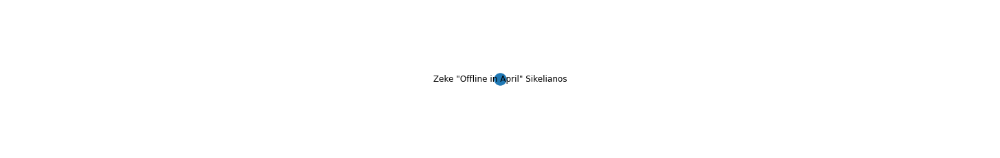

Subgraph has 1 nodes


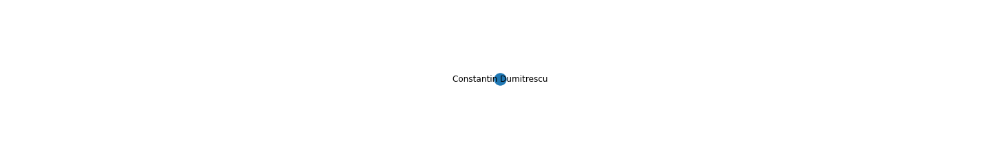

Subgraph has 1 nodes


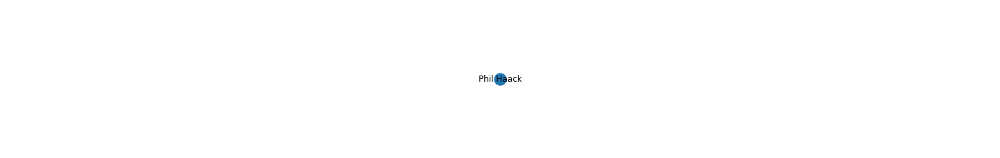

Subgraph has 1 nodes


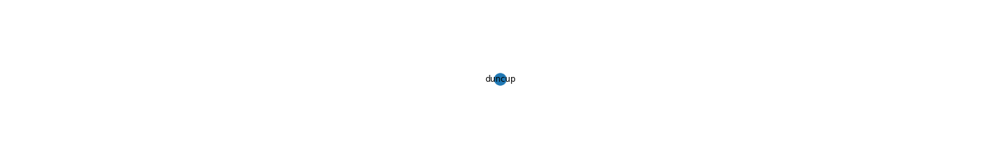

Subgraph has 1 nodes


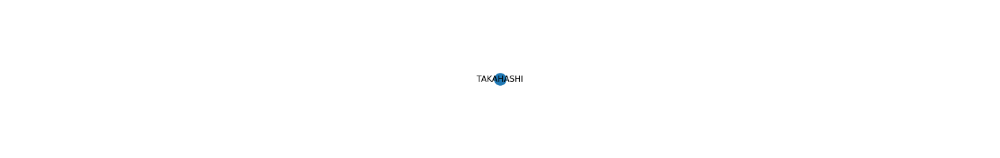

Subgraph has 1 nodes


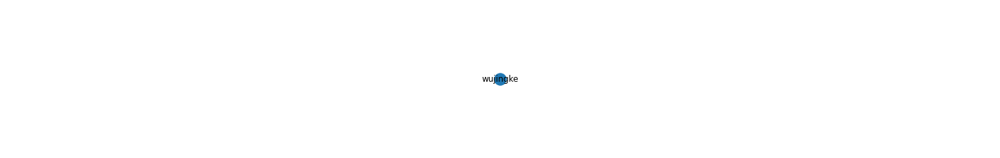

Subgraph has 1 nodes


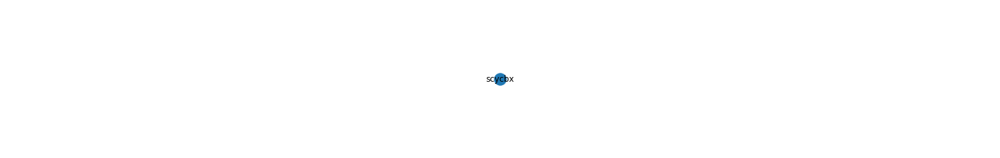

Subgraph has 1 nodes


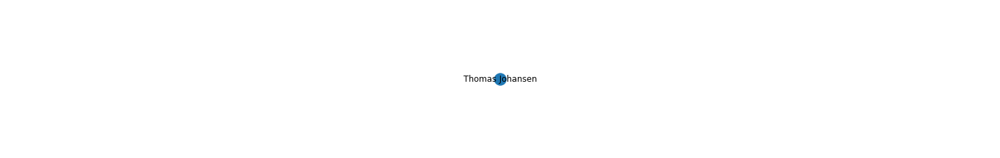

Subgraph has 1 nodes


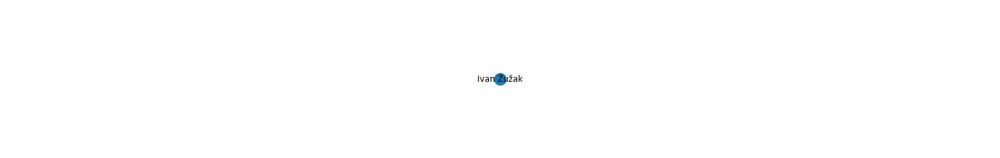

Subgraph has 1 nodes


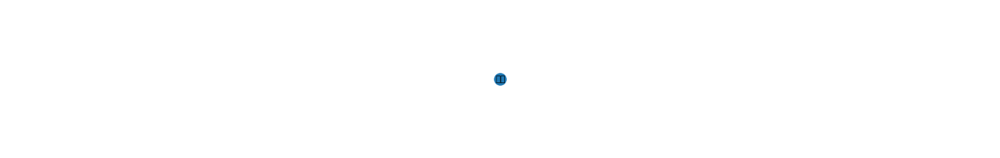

Subgraph has 1 nodes


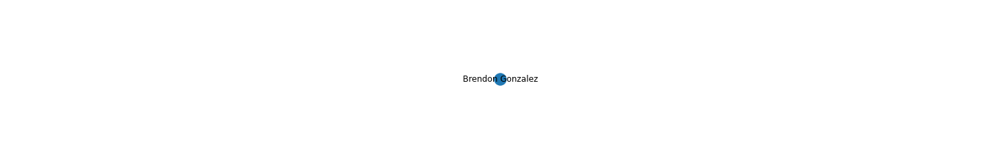

Subgraph has 1 nodes


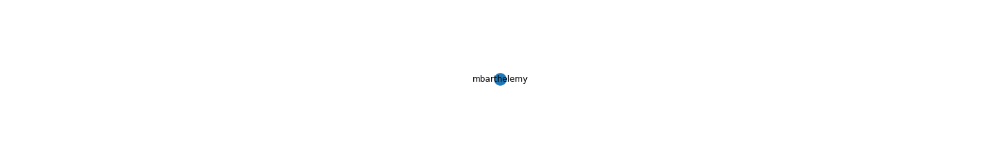

Subgraph has 1 nodes


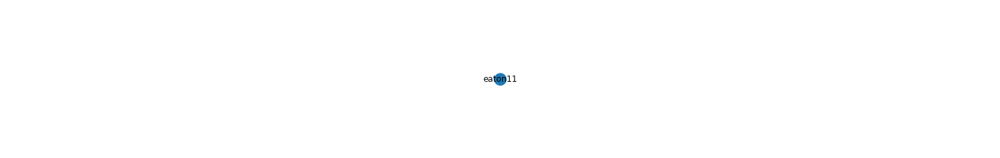

Subgraph has 1 nodes


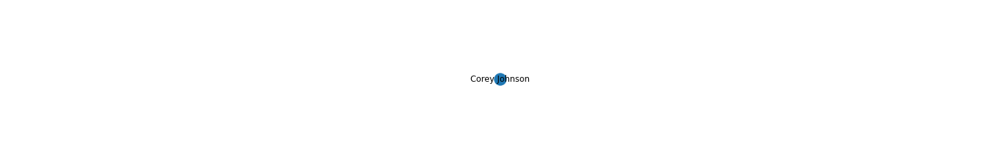

In [72]:
graph_un = graph.to_undirected()
subgraphs = [graph_un.subgraph(c) for c in nx.connected_components(graph_un)]
for sg in subgraphs:
    print(f'Subgraph has {len(sg.nodes())} nodes')
    nx.draw(sg, with_labels=True)
    plt.show()

### Largest connected component

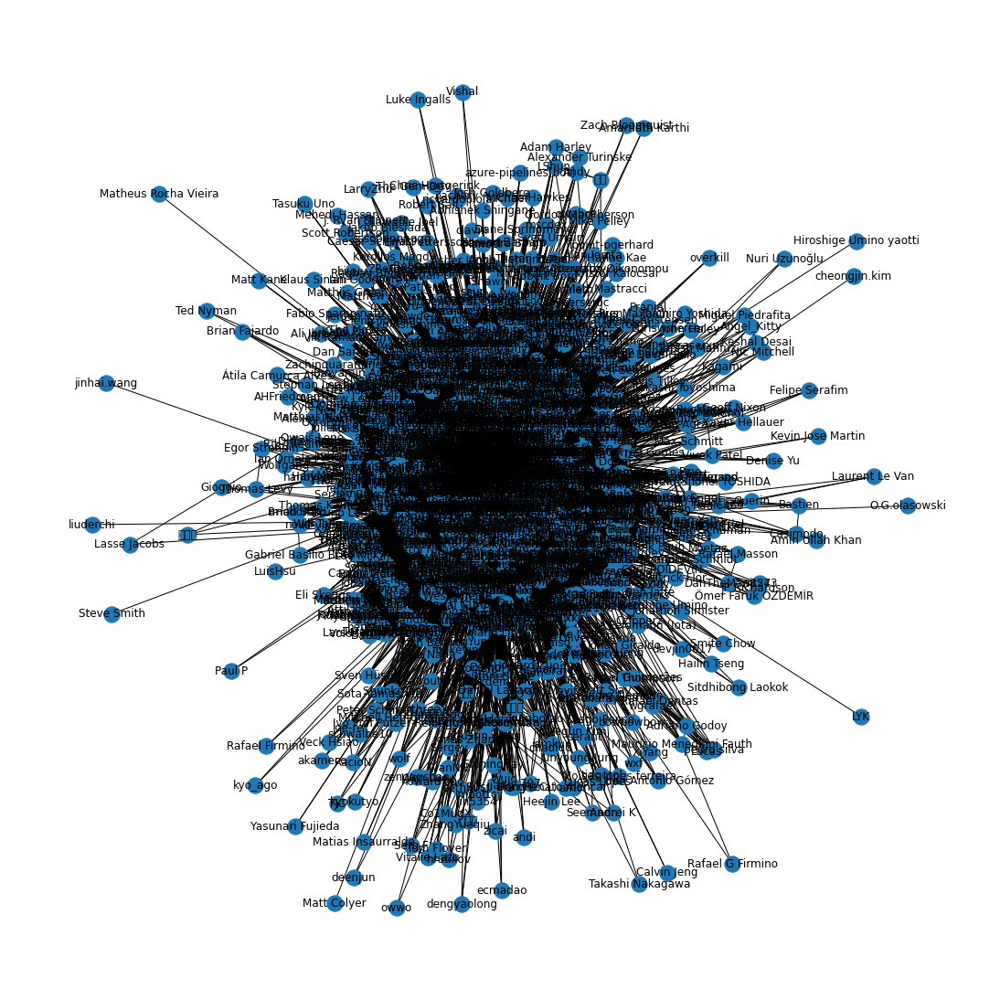

In [73]:
largest_ccs = sorted(subgraphs, key=lambda x: len(x))[-1]
plt.figure(figsize=(15, 15))
nx.draw(largest_ccs, with_labels=True)
plt.show()

## Ciques

In [74]:
cliques = sorted([len(cl) for cl in nx.find_cliques(graph_un)], reverse=True)
print(cliques)
print(f'There are {len(cliques)} cliques.')

[147, 104, 96, 94, 90, 87, 86, 85, 83, 83, 83, 82, 80, 80, 79, 79, 79, 78, 78, 78, 78, 77, 77, 76, 76, 76, 75, 75, 75, 74, 74, 74, 73, 73, 73, 73, 73, 73, 72, 72, 72, 72, 71, 71, 71, 71, 71, 71, 71, 71, 71, 71, 71, 71, 70, 70, 70, 70, 70, 70, 70, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 67, 66, 66, 66, 66, 66, 66, 66, 66, 66, 66, 66, 66, 66, 66, 66, 66, 66, 66, 66, 66, 66, 66, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 62, 62, 6

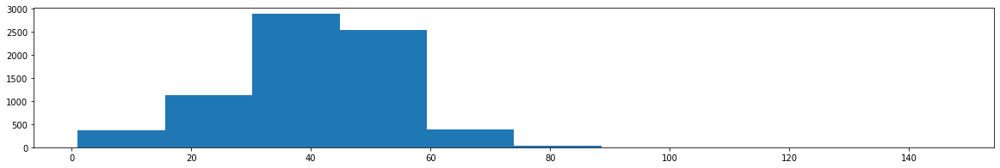

In [75]:
plt.hist(cliques)
plt.show()